# Learning Plotly ([youtube tutorial](https://www.youtube.com/watch?v=GGL6U0k8WYA&ab_channel=DerekBanas))

## Imports

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
import chart_studio.plotly as py
import seaborn as sns
import cufflinks as cf
%matplotlib inline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

## 03:49 Basics


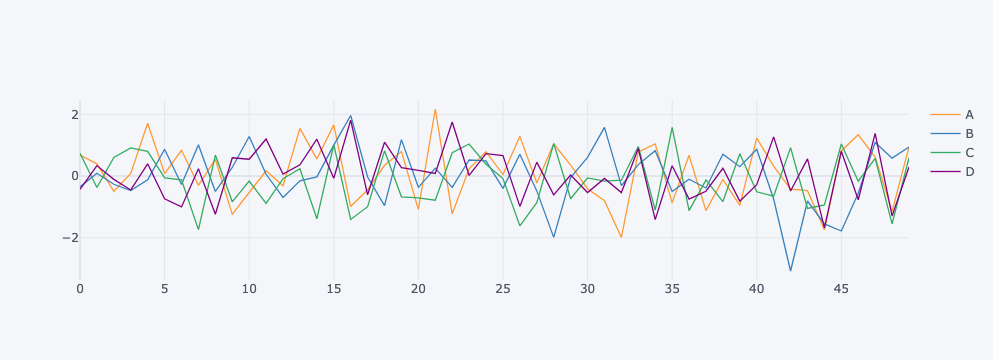

In [2]:
arr_1 = np.random.randn(50,4)
df_1 = pd.DataFrame(arr_1, columns=['A', 'B', 'C', 'D'])
df_1.head()
df_1.iplot()


## 05:41 Line Plots


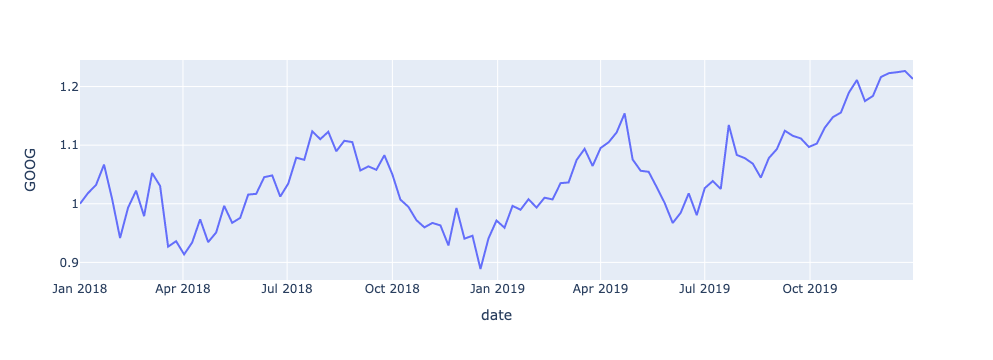

In [3]:
df_stocks = px.data.stocks()
px.line(df_stocks, x='date', y='GOOG', labels={'x': 'Date', 'y': 'Price'})

In [4]:
df_my_stocks = pd.read_csv('data/data_part1.csv')
df_my_stocks.head()

,Date,SPY,SPY_Volume,VOO,VOO_Volume,IVV,IVV_Volume,QQQ,QQQ_Volume,DIA,DIA_Volume
0,2021-04-05 16:30,403.554993,1969280.0,370.959991,361355.0,405.049988,202121.0,327.230011,1343213.0,334.029999,233559.0
1,2021-04-05 16:31,403.690002,2312088.0,371.089996,390153.0,405.209991,263877.0,327.000000,1756074.0,334.361511,270552.0
2,2021-04-05 16:32,403.869995,2637526.0,371.250000,409075.0,405.339996,276879.0,327.179993,1958859.0,334.510010,321314.0
3,2021-04-05 16:33,404.220001,3194117.0,371.510010,461844.0,405.660004,331259.0,327.480011,2173754.0,334.545013,399998.0
4,2021-04-05 16:34,404.140015,3624006.0,371.470001,485728.0,405.640015,355101.0,327.579987,2372529.0,334.559998,426362.0


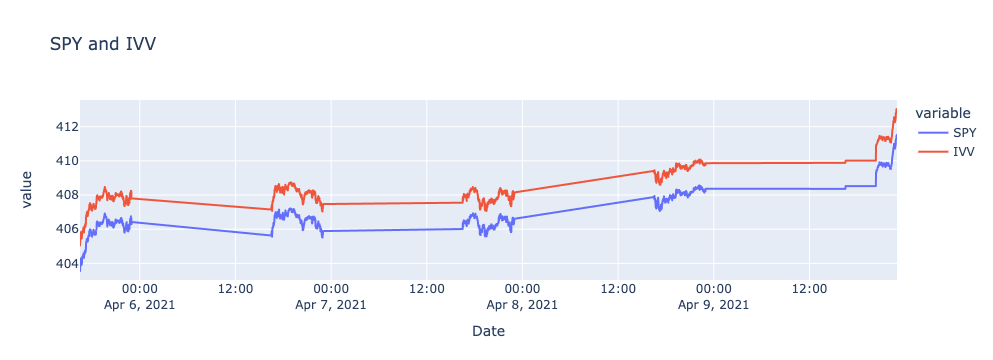

In [5]:
# px.line(df_my_stocks, x=df_my_stocks.index, y='SPY', labels={'x': 'Date', 'y': 'Price'})
px.line(df_my_stocks, x='Date', y=['SPY', 'IVV'], labels={'x': 'Date', 'y': 'Price'}, title='SPY and IVV')

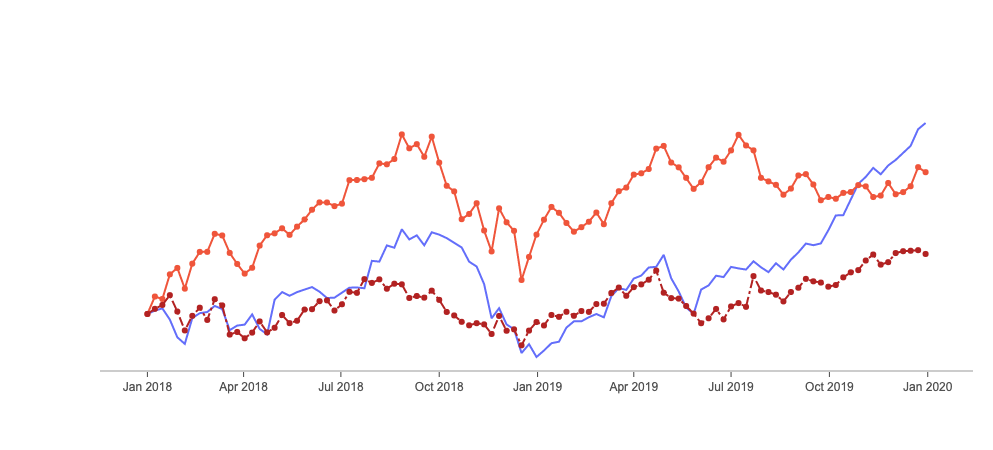

In [6]:
px.line(df_stocks, x='date', y=['GOOG', 'AAPL'], labels={'x': 'Date', 'y': 'Price'})
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, mode='lines+markers', name='Amazone'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, mode='lines+markers', name='Google', line=dict(color='firebrick', width=2, dash='dashdot')))

fig.update_layout(
    xaxis=dict(
        showline=True, showgrid=False, showticklabels=True, linecolor='rgb(204, 204, 204)', linewidth=2, ticks='outside', tickfont=dict(
            family='Arial', size=12, color='rgb(82,82,82)',
        ),
    ),
    yaxis=dict(
        showgrid=False, zeroline=False, showline=False, showticklabels=False
    ),
    autosize=False,
    margin=dict(
        autoexpand=False, l=100, r=20, t=110,
    ),
    showlegend=False,
    plot_bgcolor='White'
)

fig.show()

## Bar Charts

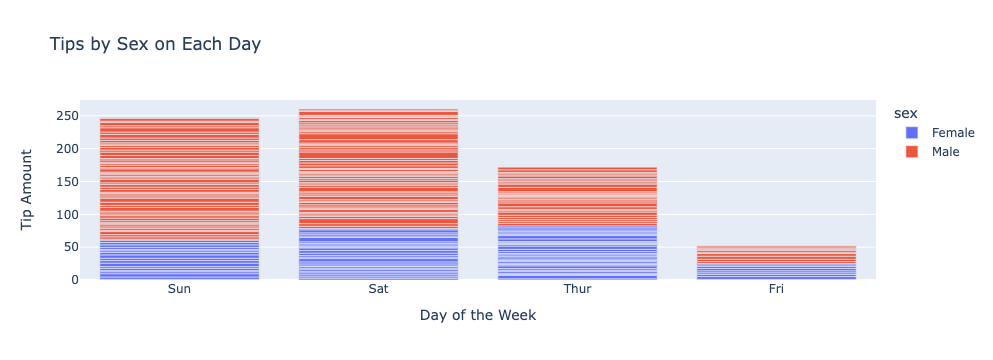

In [7]:
df_us = px.data.gapminder().query('country == "United States"')
px.bar(df_us, x='year', y='pop')

df_tips = px.data.tips()
px.bar(df_tips, x='day', y='tip', color='sex', title='Tips by Sex on Each Day', labels={'tip': 'Tip Amount', 'day': 'Day of the Week'})

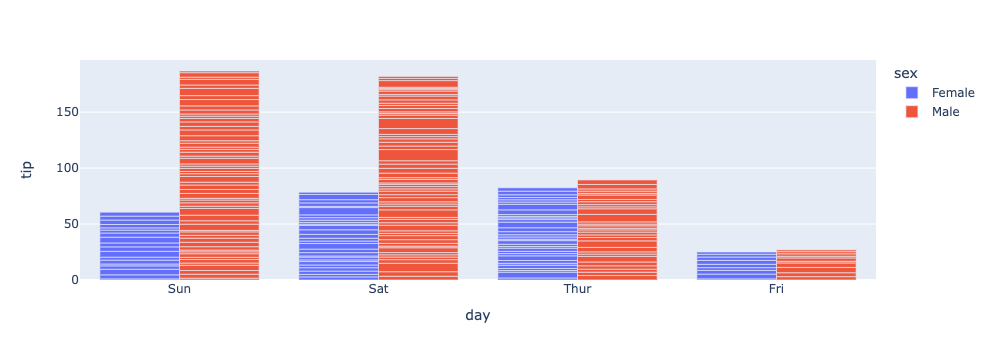

In [8]:
px.bar(df_tips, x='day', y='tip', color='sex', barmode='group')


## 26:07 Scatter Plots


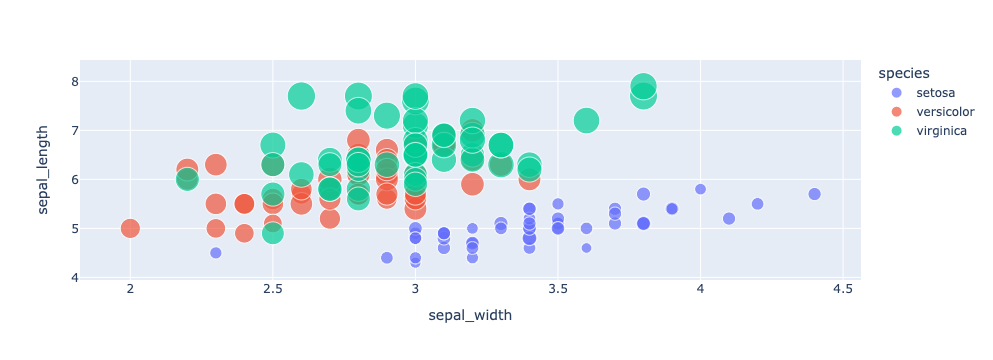

In [9]:
df_iris = px.data.iris()
df_iris.head()
px.scatter(df_iris, x='sepal_width', y='sepal_length', color='species', size='petal_length', hover_data=['petal_width'])
# px.scatter(df_iris, x='sepal_width', y='sepal_length', color='species', size='petal_length')

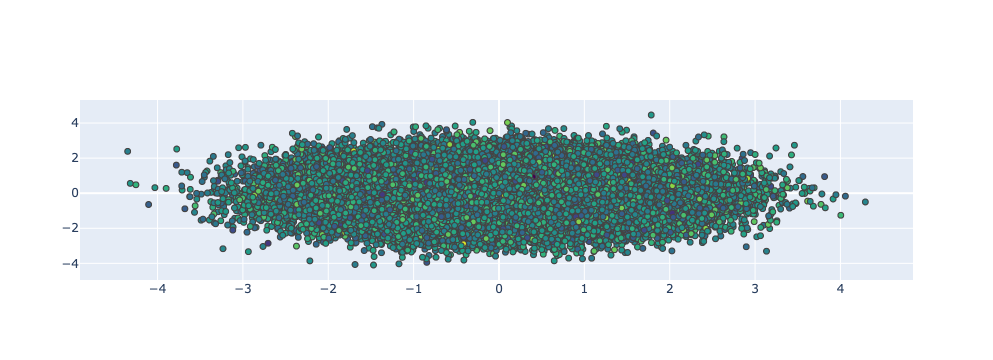

In [10]:
# Create a customized scatter with black marker edges with line width 2, opaque
# and colored based on width. Also show a scale on the right
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_iris.sepal_width, y=df_iris.sepal_length,
    mode='markers',
    marker_color=df_iris.sepal_width,
    text=df_iris.species,
    marker=dict(showscale=True)
))
fig.update_traces(marker_line_width=2, marker_size=10)

# Working with a lot of data use Scattergl
fig = go.Figure(data=go.Scattergl(
    x = np.random.randn(100000),
    y = np.random.randn(100000),
    mode='markers',
    marker=dict(
        color=np.random.randn(100000),
        colorscale='Viridis',
        line_width=1
    )
))
fig

## 32:43 Pie Charts

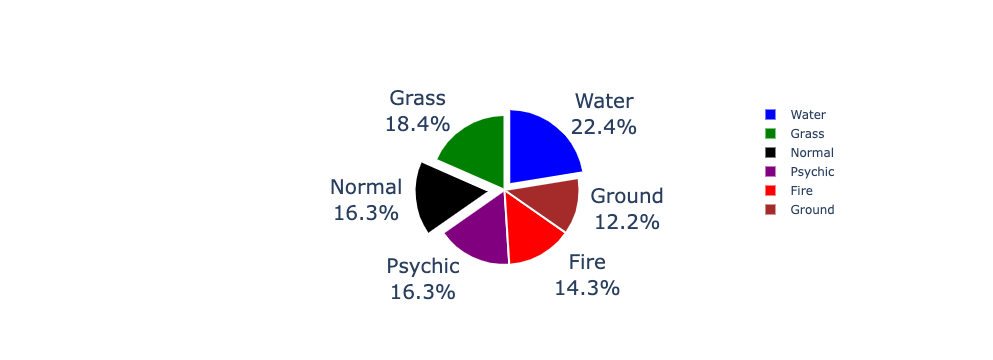

In [11]:
# Create Pie chart of the largest nations in Asia
# Color maps here plotly.com/python/builtin-colorscales/
df_samer = px.data.gapminder().query("year == 2007").query("continent == 'Asia'")
df_samer.head()
px.pie(df_samer, values='pop',
       names='country',
       title='Population of Asian continent',
       color_discrete_sequence=px.colors.sequential.RdBu)

# Customize pie chart
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data=[go.Pie(labels=['Water','Grass','Normal','Psychic', 'Fire', 'Ground'],
                       values=[110,90,80,80,70,60])])
# Define hover info, text size, pull amount for each pie slice, and stroke
fig.update_traces(hoverinfo='label+percent', textfont_size=20,
                  textinfo='label+percent', pull=[0.1, 0, 0.2, 0, 0, 0],
                  marker=dict(colors=colors, line=dict(color='#FFFFFF', width=2)))
fig.show()

## 34:27 Colormaps


## 39:45 Histograms


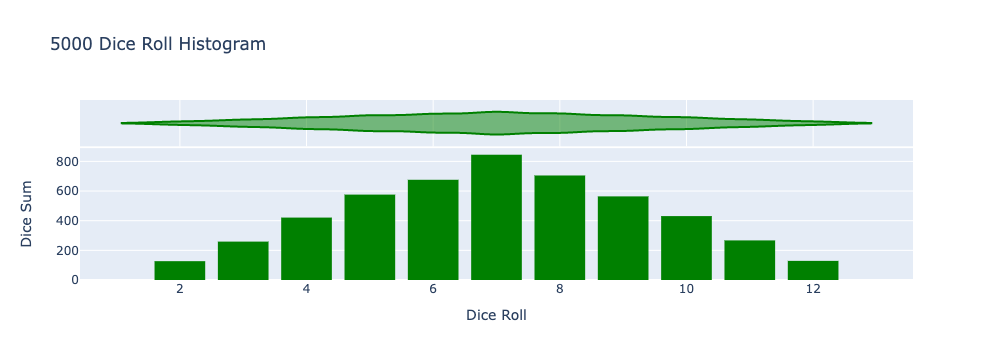

In [12]:
# Plot histogram based on rolling 2 dice
dice_1 = np.random.randint(1,7,5000)
dice_2 = np.random.randint(1,7,5000)
dice_sum = dice_1 + dice_2
# bins represent the number of bars to make
# Can define x label, color, title
# marginal creates another plot (violin, box, rug)
fig = px.histogram(dice_sum, nbins=11, labels={'value':'Dice Roll'},
             title='5000 Dice Roll Histogram', marginal='violin',
            color_discrete_sequence=['green'])

fig.update_layout(
    xaxis_title_text='Dice Roll',
    yaxis_title_text='Dice Sum',
    bargap=0.2, showlegend=False
)

## 44:28 Box Plots


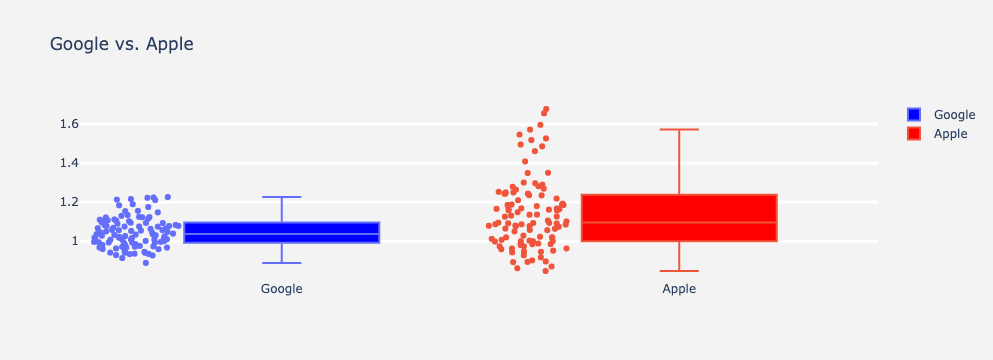

In [13]:
# A box plot allows you to compare different variables
# The box shows the quartiles of the data. The bar in the middle is the median 
# The whiskers extend to all the other data aside from the points that are considered
# to be outliers
df_tips = px.data.tips()
# We can see which sex tips the most, points displays all the data points
px.box(df_tips, x='sex', y='tip', points='all')

# Display tip sex data by day
px.box(df_tips, x='day', y='tip', color='sex')

# Adding standard deviation and mean
fig = go.Figure()
fig.add_trace(go.Box(x=df_tips.sex, y=df_tips.tip, marker_color='blue',
                    boxmean='sd'))

# Complex Styling
df_stocks = px.data.stocks()
fig = go.Figure()
# Show all points, spread them so they don't overlap and change whisker width
fig.add_trace(go.Box(y=df_stocks.GOOG, boxpoints='all', name='Google',
                    fillcolor='blue', jitter=0.5, whiskerwidth=0.2))
fig.add_trace(go.Box(y=df_stocks.AAPL, boxpoints='all', name='Apple',
                    fillcolor='red', jitter=0.5, whiskerwidth=0.2))
# Change background / grid colors
fig.update_layout(title='Google vs. Apple', 
                  yaxis=dict(gridcolor='rgb(255, 255, 255)',
                 gridwidth=3),
                 paper_bgcolor='rgb(243, 243, 243)',
                 plot_bgcolor='rgb(243, 243, 243)')

## 52:30 Violin Plots


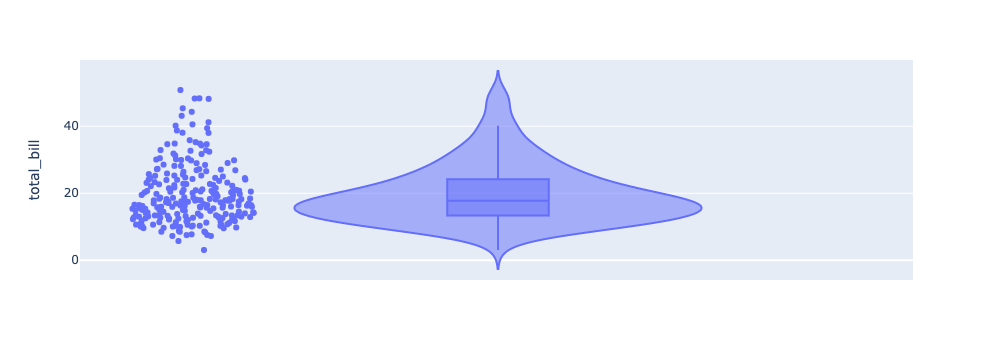

In [4]:
# Violin Plot is a combination of the boxplot and KDE
# While a box plot corresponds to data points, the violin plot uses the KDE estimation
# of the data points
df_tips = px.data.tips()
px.violin(df_tips, y="total_bill", box=True, points='all')

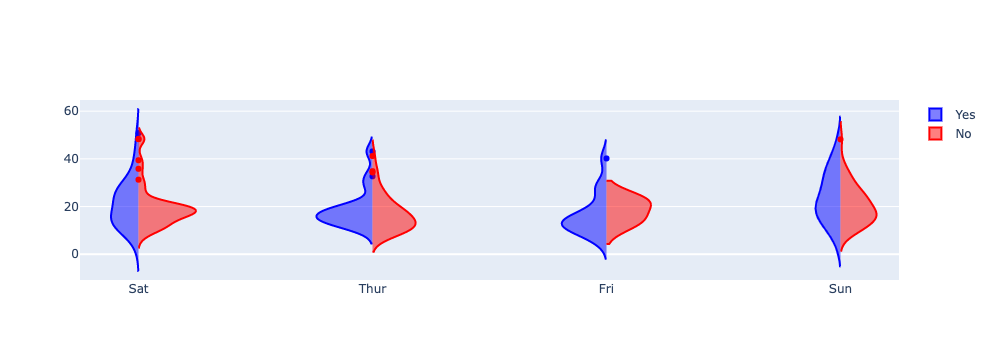

In [3]:


# Multiple plots
px.violin(df_tips, y="tip", x="smoker", color="sex", box=True, points="all",
          hover_data=df_tips.columns)

# Morph left and right sides based on if the customer smokes
fig = go.Figure()
fig.add_trace(go.Violin(x=df_tips['day'][ df_tips['smoker'] == 'Yes' ],
                        y=df_tips['total_bill'][ df_tips['smoker'] == 'Yes' ],
                        legendgroup='Yes', scalegroup='Yes', name='Yes',
                        side='negative',
                        line_color='blue'))
fig.add_trace(go.Violin(x=df_tips['day'][ df_tips['smoker'] == 'No' ],
                        y=df_tips['total_bill'][ df_tips['smoker'] == 'No' ],
                        legendgroup='Yes', scalegroup='Yes', name='No',
                        side='positive',
                        line_color='red'))

## 58:12 Density Heatmap


In [8]:
flights = sns.load_dataset("flights")
flights.head()

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121


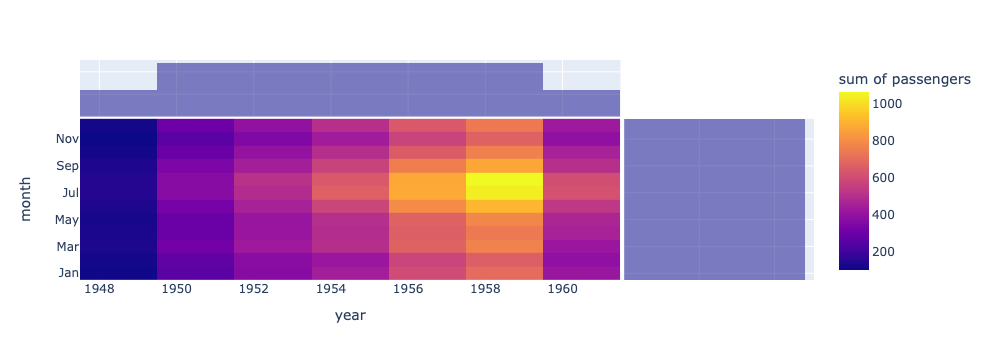

In [6]:
# Create a heatmap using Seaborn data
flights = sns.load_dataset("flights")
flights

# You can set bins with nbinsx and nbinsy
fig = px.density_heatmap(flights, x='year', y='month', z='passengers', 
                         color_continuous_scale="Viridis")
fig

# You can add histograms
fig = px.density_heatmap(flights, x='year', y='month', z='passengers', 
                         marginal_x="histogram", marginal_y="histogram")
fig

## 1:01:30 3D Scatter Plots


## 1:02:48 3D Line Plots


## 1:03:35 Scatter Matrix


## 1:04:21 Map Scatter Plot


## 1:06:38 Choropleth Maps


## 1:09:17 Polar Chart


## 1:11:50 Ternary Plot


## 1:13:24 Facets

## 1:18:17 Animated Plots
